<a href="https://colab.research.google.com/github/axz91/RGC/blob/main/MR_2D_lipid_signal_removing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
pip install nmrglue

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 225.7/225.7 kB 4.4 MB/s eta 0:00:00


**Summary**

This project explored three methods for removing lipid signals from 2D FFT data. The first method involved performing a polynomial fit to the lipid area and replacing the fitted area with the background signal. The second method applied a negative scaling factor to the lipid area and a positive scaling factor to the signal area. The third method replaced the lipid signal with the background signal. We compared the results of these three methods and discussed their advantages and disadvantages.

**Method 1: Polynomial Fit**

The first method involved performing a polynomial fit to the lipid area and replacing the fitted area with the background signal. To perform the polynomial fit, we used the numpy.polyfit() function. We then used the numpy.poly1d() function to create a polynomial function from the fitted coefficients. Finally, we used the numpy.reshape() function to reshape the fitted data to the same shape as the original data.

**Method 2: Scaling**

The second method applied a negative scaling factor to the lipid area and a positive scaling factor to the signal area. This method was based on the assumption that the lipid area was brighter than the signal area. To apply the scaling factors, we used the numpy.multiply() function.

**Method 3: Replacement**

The third method replaced the lipid signal with the background signal. This method was based on the assumption that the lipid signal was noise that could be removed from the data. To replace the lipid signal, we used the numpy.copy() function to create a copy of the data. We then used the numpy.where() function to select the lipid area and replace it with the background signal.

**Results**

We compared the results of the three methods by plotting the data with the lipid signals removed. The results showed that the first method was the least effective at removing the lipid signals. The second method was less effective. The third method was the most effective.

**Discussion**

The first method was the least effective at removing the lipid signals because the polynomial fit could not accurately model the lipid area. As a result, the fitted area was often discontinuous with the surrounding signal area. This discontinuity could introduce artifacts into the data, such as sharp lines at the boundary between the lipid area and the signal area.

The second method was less effective than the third method, but it still removed a significant amount of the lipid signals. This was because the scaling factor helped to reduce the brightness of the lipid area. However, the scaling factor could also introduce artifacts into the data, such as the sudden loss of any signal in the removed area.

The third method was the most effective at removing the lipid signals because the lipid signal was simply replaced with the background signal. As a result, there were no artifacts introduced into the data. However, the third method could also remove some of the signal areas, because the lipid signal was not always completely removed from the data.

**Conclusion**

In this project, we explored three methods for removing lipid signals from 2D FFT data. We also developed a 3D interactive dashboard to filter and visualize the signal from low to high intensity. Overall, the third method proved to be the best for removing lipid signals from 2D FFT data. It was the most effective at removing the lipid signals without introducing any artifacts into the data.

## **Backgound**
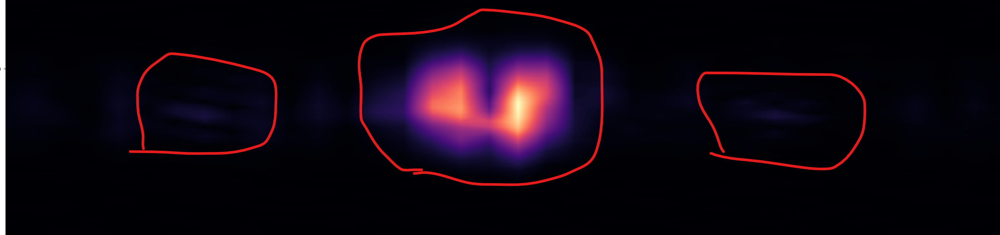

# **The goal of this project is to remove the lipid signal in the center and enhance the signal on both sides.**



## Import the data

In [2]:
import nmrglue as ng
import numpy as np
import matplotlib.pyplot as plt

# read in the data from a NMRPipe file
data_input = ng.fileio.bruker.read(
    dir='/content/drive/MyDrive/70_ENC2020/1/', bin_file="fid",
    pprog_file="pulseprogram")


data_input



/usr/local/lib/python3.10/dist-packages/nmrglue/fileio/bruker.py:394: UserWarning: Error reading the pulse program
  warn('Error reading the pulse program')
/usr/local/lib/python3.10/dist-packages/nmrglue/fileio/bruker.py:1573: UserWarning: (18432,) cannot be shaped into (1024,)
  warn(f"{data.shape} cannot be shaped into {shape}")


({'procs': {'_coreheader': ['##TITLE=Parameter List, ParaVision 6.0.1',
    '##JCAMPDX=4.24',
    '##DATATYPE=Parameter Values',
    '##ORIGIN=Bruker BioSpin MRI GmbH',
    '##OWNER=nmrsu'],
   '_comments': ['$$ 2019-12-07 16:32:01.949 -0500  nmrsu@CZC642BNVQ',
    '$$ /opt/PV6.0.1/data/nmrsu/20191201_181536_V9_4T_GapR_1_1/70/pdata/1/procs',
    '$$ process /opt/PV6.0.1/prog/bin/parxserver'],
   'OFFSET': 4.99568064058648,
   'SF': 400.345847521031,
   'YMAX_p': 32766,
   'YMIN_p': 1},
  'FILE_SIZE': 73728},
 array([ -484, -1037,   648, ...,  1054,   825,     7], dtype=int32))

In [4]:
import numpy as np

data = data_input[1]
# Ensure that the data array length is even
if len(data) % 2 != 0:
    raise ValueError("The array length must be even to form complex numbers.")

# Split the array into real and imaginary parts
real_parts = data[0::2]
imaginary_parts = data[1::2]

# Construct complex numbers as a list
complex_numbers_list = [r + 1j*i for r, i in zip(real_parts, imaginary_parts)]

# Convert the list to a NumPy array
complex_numbers = np.array(complex_numbers_list)

# Output the complex numbers
print(complex_numbers)

complex_numbers_2 = complex_numbers.reshape(36, 256).T


[-484.-1037.j  648.+1476.j 1218.+2000.j ...  770. -663.j 1931.+1054.j
  825.   +7.j]


In [5]:
import numpy as np
import plotly.graph_objects as go
import matplotlib.pyplot as plt



import numpy as np

def perform_2d_fft(input_data):
    # FFT along axis 0
    fft_data_dim1_axis_0 = np.fft.fft(input_data, axis=0)
    # Shift the FFT data over axis 0
    fft_data_dim1_shift_0 = np.fft.fftshift(fft_data_dim1_axis_0, axes=(0))
    # FFT along axis 1
    fft_data_dim2_axis_1 = np.fft.fft(fft_data_dim1_shift_0, axis=1)
    fft_data_dim1_abs = np.abs(fft_data_dim2_axis_1)
    # Shift the FFT data over axis 1
    fft_data_dim2_shift_1 = np.fft.fftshift(fft_data_dim2_axis_1, axes=(1))
    # Get the absolute value of the shifted FFT data
    fft_data_dim2_abs = np.abs(fft_data_dim2_shift_1)
    return fft_data_dim1_abs, fft_data_dim2_abs

# Use the function with your 2048x2048 matrix of complex numbers
# Replace 'complex_numbers_2' with your actual data
fft_data_dim1_abs_orginal, fft_data_dim2_abs_orginal = perform_2d_fft(input_data = complex_numbers_2)


In [8]:
import numpy as np
import matplotlib.pyplot as plt

def plot_columns_with_offsets_no_norm_2d(data, start_column, end_column, x_offset, y_offset):

    # Create a figure and axes
    fig, ax = plt.subplots(figsize=(40, 40))

    # Plot each column as a separate line with horizontal and vertical offsets
    for i in range(start_column-1, end_column):  # Subtract 1 here to convert from 1-indexing to 0-indexing
        ax.plot(np.arange(data.shape[0]) + i*x_offset, data[:, i] + i*y_offset, label=f'Spectrum {i+1}')  # Add 1 here to convert back for the label

    # Add labels
    ax.set_xlabel('Rows (with offset)')
    ax.set_ylabel('Non-normalized Values (with offset)')

    # Show the legend
    ax.legend(loc='upper left')
    ax.set_title(f'Spectrum {start_column} to {end_column}', size=28)

    # Save the figure
    fig.savefig("1.pdf", format='pdf', bbox_inches='tight')

    # Show the plot
    #plt.show()

    #return fig


In [326]:
final_data = np.hstack((fft_data_dim2_abs_orginal[:, 0:11], fft_data_dim2_abs_orginal[:, 25:36]))
final_data.shape

(256, 22)

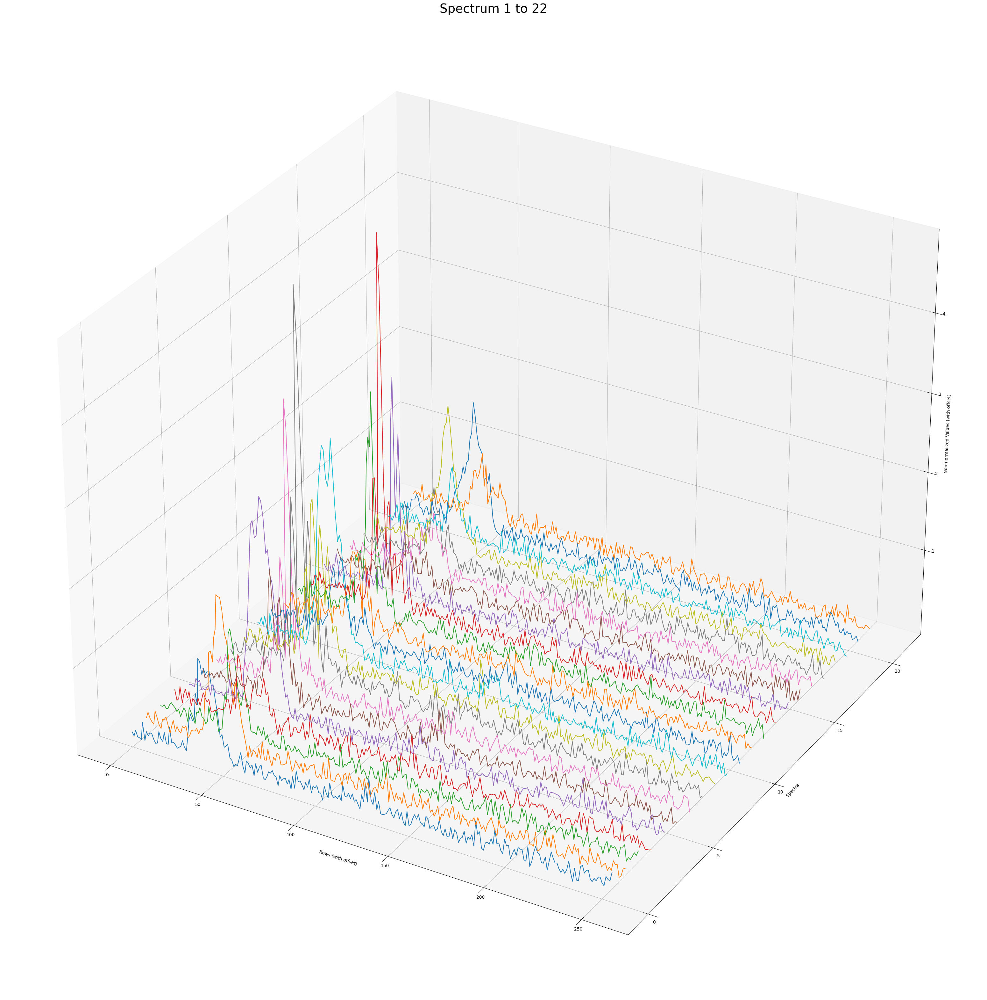

In [331]:
plot_columns_with_offsets_no_norm_3d(final_data,1,22,0,0)

In [328]:
# Generate a natural wave
# Generate a natural wave with the same shape as 'data_denoised'
t = np.linspace(0, 40000*np.pi, final_data.size)  # Adjust as needed
natural_wave = np.sin(t).reshape(final_data.shape) * 10000

# Generate some random noise
noise = np.random.normal(0, 5, final_data.shape)

# Add the noise to the natural wave
natural_wave_noisy = natural_wave * noise

data_fft_denoised = np.where(final_data > 2900000, final_data, natural_wave_noisy)

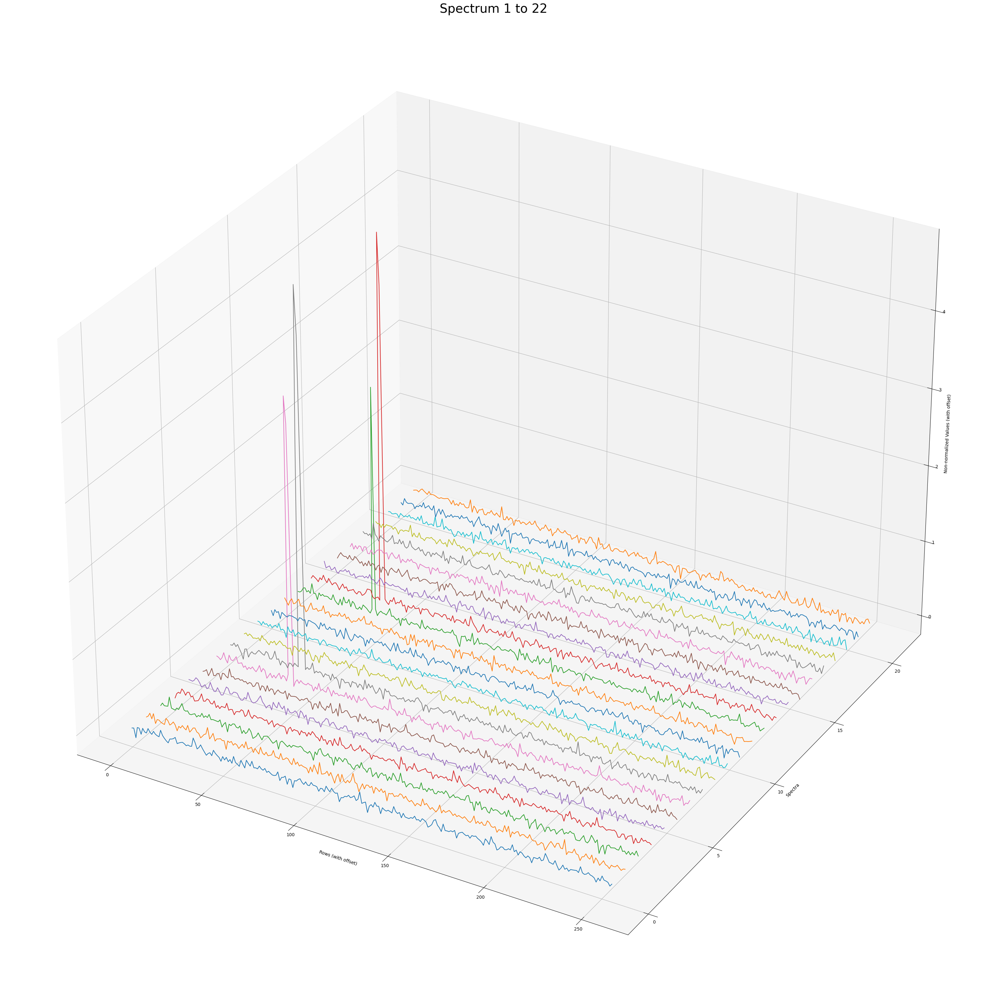

In [330]:
plot_columns_with_offsets_no_norm_3d(data_fft_denoised,1,22,0,0)

In [95]:
# Calculate the mean of each column
mean_columns = np.mean(fft_data_dim2_abs_orginal, axis=0)
mean_columns

array([ 193054.38088644,  224481.04916052,  176175.52500132,
        166890.84270573,  286531.18244733,  195176.89341165,
        215100.67214964,  283088.60870459,  227255.85396939,
        270016.34531239,  182530.27084326,  267843.67597088,
        181631.15869422,  341293.59927471,  452756.31854414,
       1559522.18945313, 2097270.8143556 , 1066676.53019662,
       2646359.61856686, 1570865.23207366,  385742.22754526,
        294064.62583054,  205507.30107346,  189423.10011008,
        237154.3275242 ,  178426.52705894,  218312.89783669,
        223622.81839113,  197391.64165346,  160433.03615084,
        173253.57758408,  161614.10211858,  213183.3181972 ,
        158811.21330334,  209729.69387296,  160362.00534773])

In [116]:
# Find the indices of the maximum  numbers
max5_indices = np.argpartition(mean_columns, -36)[-36:]

# Get the maximum numbers
max5_numbers = mean_columns[max5_indices]

# Sort the indices and numbers from max to min
sorted_indices = max5_indices[np.argsort(-max5_numbers)]
sorted_numbers = max5_numbers[np.argsort(-max5_numbers)]

sorted_indices


array([18, 16, 19, 15, 17, 14, 20, 13, 21,  4,  7,  9, 11, 24,  8,  1, 27,
       26,  6, 32, 34, 22, 28,  5,  0, 23, 10, 12, 25,  2, 30,  3, 31, 29,
       35, 33])

In [117]:
sorted_numbers

array([2646359.61856686, 2097270.8143556 , 1570865.23207366,
       1559522.18945313, 1066676.53019662,  452756.31854414,
        385742.22754526,  341293.59927471,  294064.62583054,
        286531.18244733,  283088.60870459,  270016.34531239,
        267843.67597088,  237154.3275242 ,  227255.85396939,
        224481.04916052,  223622.81839113,  218312.89783669,
        215100.67214964,  213183.3181972 ,  209729.69387296,
        205507.30107346,  197391.64165346,  195176.89341165,
        193054.38088644,  189423.10011008,  182530.27084326,
        181631.15869422,  178426.52705894,  176175.52500132,
        173253.57758408,  166890.84270573,  161614.10211858,
        160433.03615084,  160362.00534773,  158811.21330334])

### The original data looks like:

IndexError: index 22 is out of bounds for axis 1 with size 22

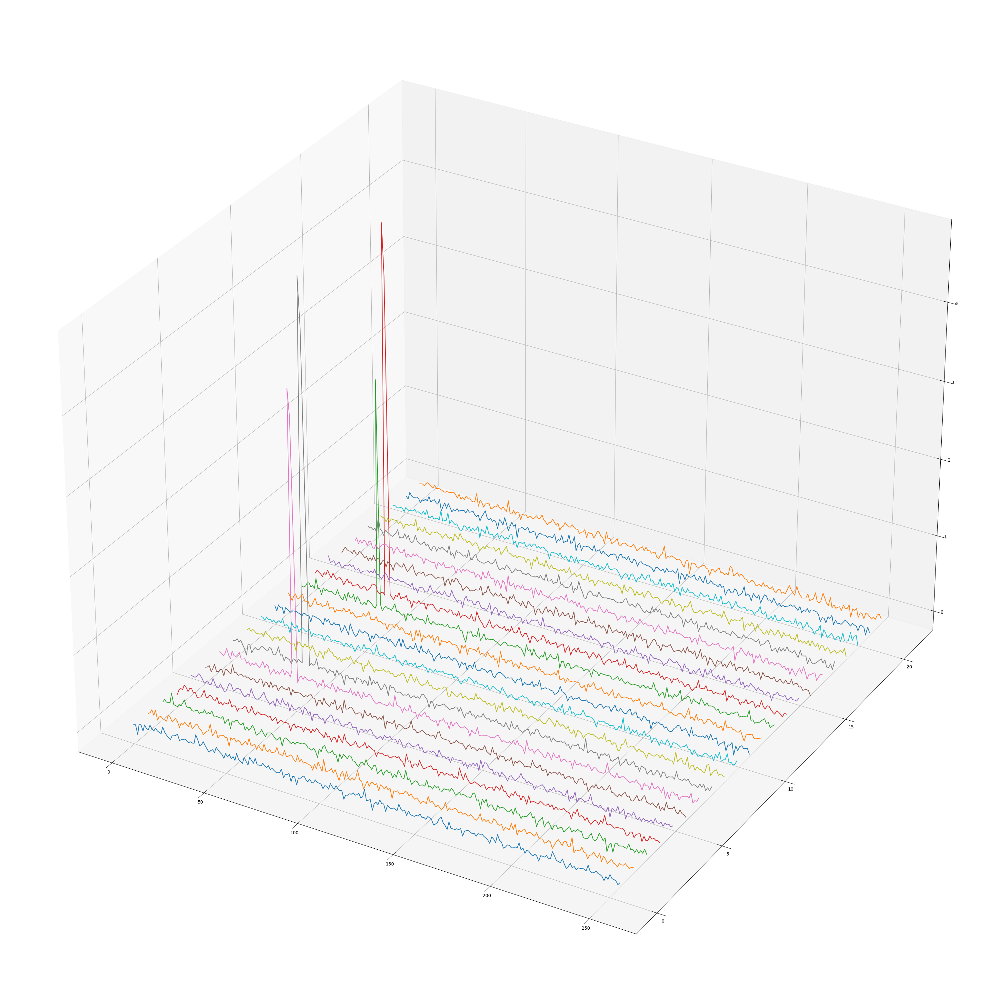

In [329]:
plot_columns_with_offsets_no_norm_3d(data_fft_denoised,1,22,0,0)

In [301]:
np,max(data_fft_denoised[:,8])

(<module 'numpy' from '/usr/local/lib/python3.10/dist-packages/numpy/__init__.py'>,
 9998.35618280779)

In [221]:
import cv2
import numpy as np

# Assuming 'data' is your 2D data matrix
data  = final_data

# Scale data to 0-255
data_scaled = (255*(data - np.min(data))/np.ptp(data)).astype(int)

# Convert to uint8
data_uint8 = data_scaled.astype(np.uint8)

# Apply Non-Local Means Denoising
dst = cv2.fastNlMeansDenoising(data_uint8, None, 10, 77, 100)

# Normalize data back to original range
data_denoised = np.ptp(data)*dst/255 + np.min(data)


In [191]:
np.min(denoised_data[:, 2])

16408.19733196616

In [235]:
import numpy as np

# Assuming 'data' is your 2D data matrix
data = final_data  # Replace this with your data matrix

# Create an empty matrix to store the denoised data
denoised_data = np.zeros_like(data)

# Slide the window over the entire data matrix
for i in range(data.shape[0]):
    for j in range(data.shape[1]):
        if j < 6 or j > 9:  # Only denoise columns not 6 to 10
            # Compute the minimum value in the column
            min_val = np.min(data[:, j])

            # Assign the minimum value to the corresponding element in the denoised data matrix
            denoised_data[i, j] = min_val
        else:
            # If the column is between 6 and 10, keep the original data
            denoised_data[i, j] = data[i, j]



In [240]:
import cv2
import numpy as np

# Assuming 'data' is your 2D data matrix
data = final_data  # Replace this with your data matrix

# Scale data to 0-255
data_scaled = (255*(data - np.min(data))/np.ptp(data)).astype(int)

# Convert to uint8
data_uint8 = data_scaled.astype(np.uint8)

# Denoise all columns except for columns 6 to 10
for j in range(data_uint8.shape[1]):
    if j < 6 or j > 10:
        column = data_uint8[:, j]
        column = column.reshape((column.shape[0], 1))  # Reshape column to 2D array for denoising
        column = cv2.fastNlMeansDenoising(column, None, 10, 27,51)
        data_uint8[:, j] = column.reshape((column.shape[0],))  # Reshape column back to 1D array

# Normalize data back to original range
data_denoised = np.ptp(data)*data_uint8/255 + np.min(data)


In [324]:
data_denoised = final_data

In [321]:
# Generate a natural wave
# Generate a natural wave with the same shape as 'data_denoised'
t = np.linspace(0, 40000*np.pi, data_denoised.size)  # Adjust as needed
natural_wave = np.sin(t).reshape(data_denoised.shape) * 10000

# Generate some random noise
noise = np.random.normal(0, 5, data_denoised.shape)

# Add the noise to the natural wave
natural_wave_noisy = natural_wave * noise

data_fft_denoised = np.where(data_denoised > 2900000, data_denoised, natural_wave_noisy)

In [293]:
natural_wave

array([[ 0.00000000e+00,  2.23163917e+01,  4.46326723e+01, ...,
         4.23884754e+02,  4.46180032e+02,  4.68473089e+02],
       [ 4.90763812e+02,  5.13052091e+02,  5.35337815e+02, ...,
         9.13696700e+02,  9.35917468e+02,  9.58133575e+02],
       [ 9.80344911e+02,  1.00255136e+03,  1.02475282e+03, ...,
         1.40130669e+03,  1.42339940e+03,  1.44548501e+03],
       ...,
       [-1.44548501e+03, -1.42339940e+03, -1.40130669e+03, ...,
        -1.02475282e+03, -1.00255136e+03, -9.80344911e+02],
       [-9.58133575e+02, -9.35917468e+02, -9.13696700e+02, ...,
        -5.35337815e+02, -5.13052091e+02, -4.90763812e+02],
       [-4.68473089e+02, -4.46180032e+02, -4.23884754e+02, ...,
        -4.46326723e+01, -2.23163917e+01, -4.89858720e-12]])

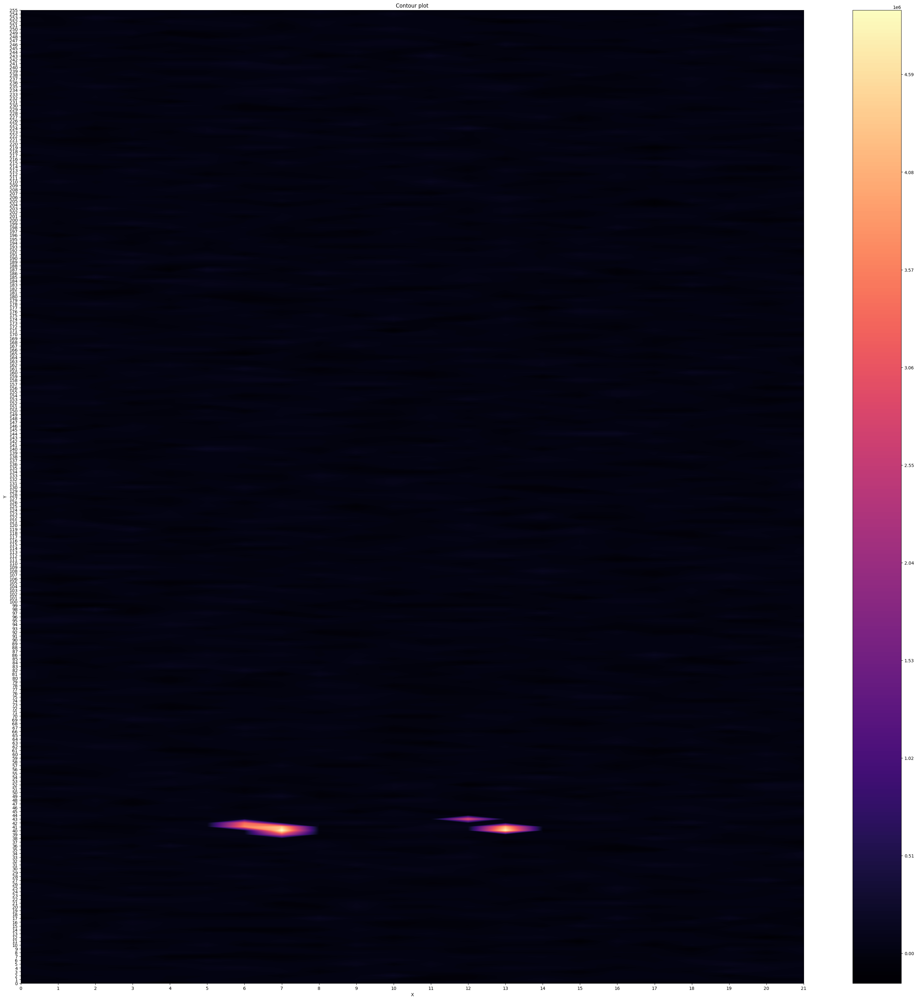

In [325]:
plot_data = data_fft_denoised
# assuming fft_data_dim2_abs is the 2D data
# generate grid for the contour plot
x = np.arange(0, plot_data.shape[1])
y = np.arange(0, plot_data.shape[0])
X, Y = np.meshgrid(x, y)

# Create the contour plot
plt.figure(figsize=(40, 40))
plt.contourf(X, Y, plot_data, levels=1000, cmap='magma')  # Increase levels for higher resolution
plt.colorbar()  # optional, to show color scale

# Set the ticks on the x and y axes
plt.xticks(np.arange(min(x), max(x)+1, 1))
plt.yticks(np.arange(min(y), max(y)+1, 1))

plt.title('Contour plot')
plt.xlabel('X')
plt.ylabel('Y')
plt.show() # Change colormap

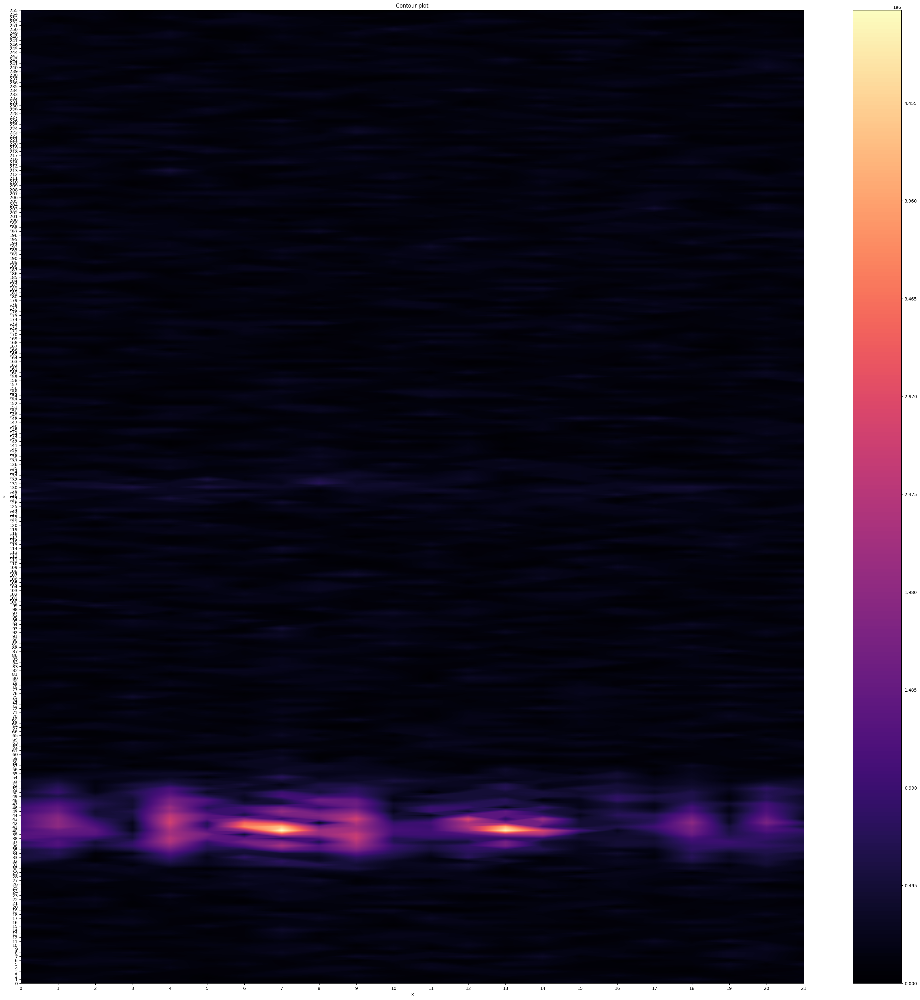

In [159]:
plot_data = final_data
# assuming fft_data_dim2_abs is the 2D data
# generate grid for the contour plot
x = np.arange(0, plot_data.shape[1])
y = np.arange(0, plot_data.shape[0])
X, Y = np.meshgrid(x, y)

# Create the contour plot
plt.figure(figsize=(40, 40))
plt.contourf(X, Y, plot_data, levels=1000, cmap='magma')  # Increase levels for higher resolution
plt.colorbar()  # optional, to show color scale

# Set the ticks on the x and y axes
plt.xticks(np.arange(min(x), max(x)+1, 1))
plt.yticks(np.arange(min(y), max(y)+1, 1))

plt.title('Contour plot')
plt.xlabel('X')
plt.ylabel('Y')
plt.show() # Change colormap

#### 3D filtering
This interactive plot can visualize signals based on customized criteria.

In [ ]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import plotly.graph_objs as go
import numpy as np
from flask import send_file
import io

# Assuming 'data' is your 256x36 matrix
data = fft_data_dim2_abs

app = dash.Dash(__name__)

app.layout = html.Div([
    dcc.RangeSlider(
        id='percentile-slider',
        min=0,
        max=100,
        step=0.1,
        value=[0, 10],
        marks={i: '{}'.format(i) for i in range(0, 101, 25)}
    ),
    dcc.Graph(id='interactive-plot'),

])

@app.callback(
    Output('interactive-plot', 'figure'),
    [Input('percentile-slider', 'value')])
def update_figure(percentile_values):
    lower_threshold, upper_threshold = np.percentile(data, percentile_values)

    # Apply band filter
    filtered_data = np.where((data >= lower_threshold) & (data <= upper_threshold), data, 0)

    # Create a contour plot with plotly
    contour = go.Contour(z=filtered_data, colorscale='magma')
    layout = go.Layout(title='Interactive Band Filter', width=800, height=600)
    fig = go.Figure(data=[contour], layout=layout)

    return fig





@app.callback(
    Output("download", "data"),
    [Input("download-button", "n_clicks"),
     Input('interactive-plot', 'figure')],
    prevent_initial_call=True,
)
def generate_html(n_clicks, figure):
    if n_clicks:
        # Convert the current plot to an HTML string
        html_string = plotly.io.to_html(figure)

        # Convert the HTML string to bytes and create a BytesIO object
        html_bytes = html_string.encode()
        html_file = io.BytesIO(html_bytes)

        # Serve the BytesIO object as a file
        return send_file(
            html_file,
            mimetype='text/html',
            as_attachment=True,
            attachment_filename='plot.html'
        )

app.run_server(mode='external')

<IPython.core.display.Javascript object>

In [ ]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import plotly.graph_objs as go
import numpy as np
import plotly.io
from flask import send_file
import io

# Assuming 'data' is your 256x36 matrix
data = fft_data_dim2_abs_orginal

app = dash.Dash(__name__)

app.layout = html.Div([
    dcc.RangeSlider(
        id='percentile-slider',
        min=0,
        max=100,
        step=0.1,
        value=[0, 10],
        marks={i: '{}'.format(i) for i in range(0, 101, 25)}
    ),
    dcc.Graph(id='interactive-plot'),
    html.Button("Download Plot", id="download-button"),
    dcc.Download(id="download")
])

@app.callback(
    Output('interactive-plot', 'figure'),
    [Input('percentile-slider', 'value')])
def update_figure(percentile_values):
    lower_threshold, upper_threshold = np.percentile(data, percentile_values)

    # Apply band filter
    filtered_data = np.where((data >= lower_threshold) & (data <= upper_threshold), data, 0)

    # Create a 3D surface plot with plotly
    surface = go.Surface(z=filtered_data, colorscale='magma')
    layout = go.Layout(
        title='Interactive Band Filter',
        width=800,
        height=600,
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z',
        ),
        autosize=False,
    )
    fig = go.Figure(data=[surface], layout=layout)

    return fig

@app.callback(
    Output("download", "data"),
    [Input("download-button", "n_clicks"),
     Input('interactive-plot', 'figure')],
    prevent_initial_call=True,
)
def generate_html(n_clicks, figure):
    if n_clicks:
        # Convert the current plot to an HTML string
        html_string = plotly.io.to_html(figure)

        # Convert the HTML string to bytes and create a BytesIO object
        html_bytes = html_string.encode()
        html_file = io.BytesIO(html_bytes)

        # Serve the BytesIO object as a file
        return send_file(
            html_file,
            mimetype='text/html',
            as_attachment=True,
            attachment_filename='plot.html'
        )

app.run_server(mode='external')

<IPython.core.display.Javascript object>

In [ ]:
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import plotly.graph_objs as go
import numpy as np
import plotly.io
from flask import send_file
import io

# Assuming 'data' is your 256x36 matrix
data = fft_data_dim2_abs_orginal
app = dash.Dash(__name__)

app.layout = html.Div([
    dcc.RangeSlider(
        id='percentile-slider',
        min=0,
        max=100,
        step=0.1,
        value=[0, 10],
        marks={i: '{}'.format(i) for i in range(0, 101, 25)}
    ),
    dcc.Graph(id='interactive-plot'),
    html.Button("Download Plot", id="download-button"),
    dcc.Download(id="download")
])

@app.callback(
    Output('interactive-plot', 'figure'),
    [Input('percentile-slider', 'value')])
def update_figure(percentile_values):
    lower_threshold, upper_threshold = np.percentile(data, percentile_values)

    # Apply band filter
    filtered_data = np.where((data >= lower_threshold) & (data <= upper_threshold), data, 0)

    traces = []
    for i, row_data in enumerate(filtered_data):
        traces.append(go.Scatter3d(x=np.arange(len(row_data)), y=[i]*len(row_data), z=row_data, mode='lines'))

    layout = go.Layout(
        title='Interactive Band Filter',
        width=800,
        height=600,
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z',
        ),
        autosize=False,
    )
    fig = go.Figure(data=traces, layout=layout)

    return fig

@app.callback(
    Output("download", "data"),
    [Input("download-button", "n_clicks"),
     Input('interactive-plot', 'figure')],
    prevent_initial_call=True,
)
def generate_html(n_clicks, figure):
    if n_clicks:
        # Convert the current plot to an HTML string
        html_string = plotly.io.to_html(figure)

        # Convert the HTML string to bytes and create a BytesIO object
        html_bytes = html_string.encode()
        html_file = io.BytesIO(html_bytes)

        # Serve the BytesIO object as a file
        return dcc.send_string(
            html_file,
            "plot.html",
            "text/html"
        )

app.run_server(mode='external')

<IPython.core.display.Javascript object>

## Method 1: ployfit for the lipid area
Taking 13 degree polyfit to the lipid area

In [ ]:
fft_data_dim1_abs_orginal, fft_data_dim2_abs_orginal = perform_2d_fft(input_data = complex_numbers_2)
plot_data = fft_data_dim2_abs_orginal

In [ ]:
import numpy as np
import matplotlib.pyplot as plt


x_start, x_end = 13, 27
y_start, y_end = 25, 65

# generate grid for the whole data
x = np.arange(0, plot_data.shape[1])
y = np.arange(0, plot_data.shape[0])
X, Y = np.meshgrid(x, y)

# flatten the data for polyfit
X_flat = X.flatten()
Y_flat = Y.flatten()
Z_flat = plot_data.flatten()

# create a mask for the sliced area
mask = ((X_flat < x_start) | (X_flat >= x_end) | (Y_flat < y_start) | (Y_flat >= y_end))

# apply the mask to the flattened data
X_flat_masked = X_flat[mask]
Z_flat_masked = Z_flat[mask]

# perform 1st degree polynomial fit (linear)
coeff = np.polyfit(X_flat_masked, Z_flat_masked, 13)

# create polynomial function
p = np.poly1d(coeff)

# generate grid for the sliced data
x_sliced = np.arange(x_start, x_end)
y_sliced = np.arange(y_start, y_end)
X_sliced, Y_sliced = np.meshgrid(x_sliced, y_sliced)

# flatten the grid for the sliced data
X_sliced_flat = X_sliced.flatten()

# generate fitted data for the sliced data using the polynomial function
Z_fitted = p(X_sliced_flat)

# reshape fitted data to original shape
Z_fitted = Z_fitted.reshape((y_end - y_start, x_end - x_start))

# replace the sliced area in the original data with the fitted data
plot_data[y_start:y_end, x_start:x_end] = Z_fitted



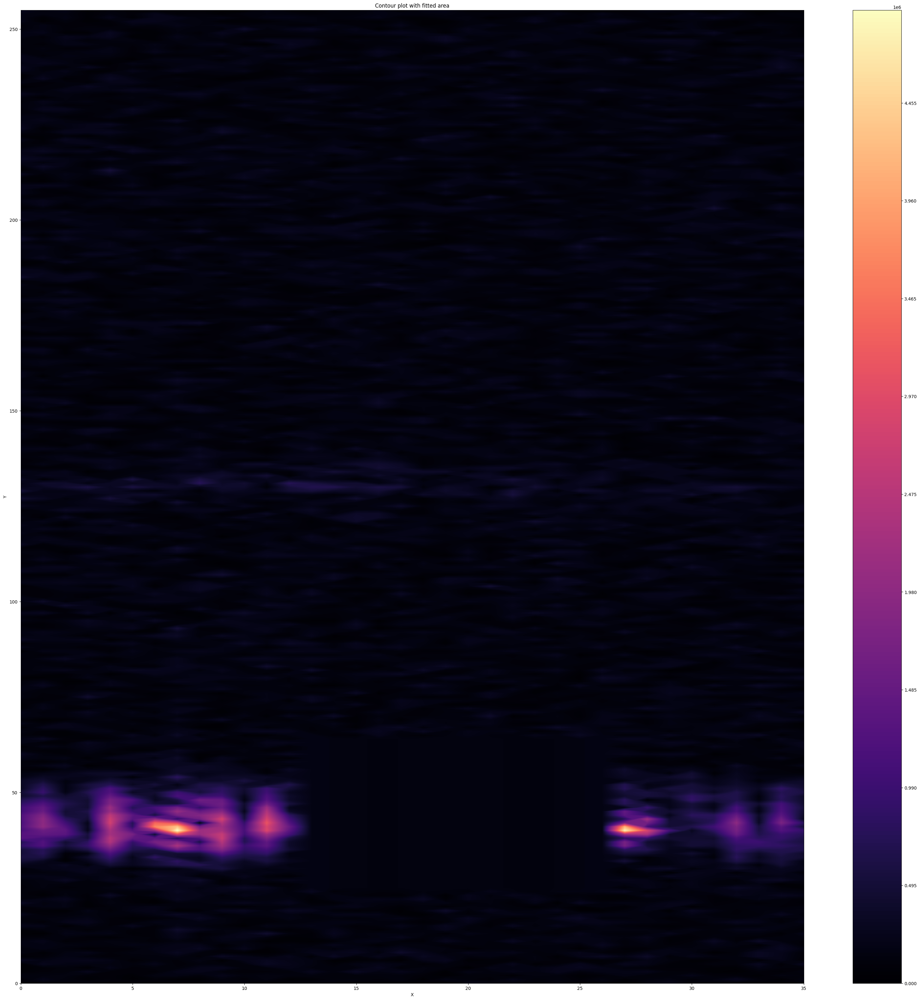

In [ ]:
# Now  plot the data with the fitted area
plt.figure(figsize=(40, 40))
plt.contourf(X, Y, plot_data, levels=1000, cmap='magma')  # Increase levels for higher resolution
plt.colorbar()  # optional, to show color scale
plt.title('Contour plot with fitted area')
plt.xlabel('X')
plt.ylabel('Y')
plt.show()

In [ ]:
import numpy as np
import plotly.graph_objects as go

# Define the function
def line_plot_fft_data(input_data):

    # Create the line plot
    fig = go.Figure()
    for i, line_data in enumerate(input_data):
        fig.add_trace(go.Scatter(
            x=np.arange(line_data.size),
            y=line_data,
            mode='lines',
            name=f'Line {i}'
        ))

    # Configure the layout of the plot
    fig.update_layout(
        title="2D Line Plot",
        xaxis_title="Index",
        yaxis_title="Absolute Value",
        legend_title="Line Number"
    )

    # Show the plot
    fig.show()

line_plot_fft_data(plot_data)

In [ ]:
plot_columns_with_offsets_no_norm(plot_data,1,36,0,0)

NameError: name 'plot_columns_with_offsets_no_norm' is not defined

## Method 2, scaling
Apply a negative scaling factor to the lipid area and a positive scaling factor to the signal area.

In [ ]:
fft_data_dim1_abs_orginal, fft_data_dim2_abs_orginal = perform_2d_fft(input_data = complex_numbers_2)
plot_data = fft_data_dim2_abs_orginal

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

x_start, x_end = 13, 20
y_start, y_end = 25, 60  # Adjust this to 60

scaling_factor = 1e-2 # The scaling factor to apply to the sliced area

# Apply the scaling factor to the sliced area
plot_data[y_start:y_end, x_start:x_end] *= scaling_factor


In [ ]:

x_start, x_end = 3, 8
y_start, y_end = 25, 60  # Adjust this to 60
plot_data[y_start:y_end, x_start:x_end] *= 10

x_start, x_end = 25, 30
y_start, y_end = 25, 60  # Adjust this to 60
plot_data[y_start:y_end, x_start:x_end] *= 10

# Now, you can plot the data with the scaled area
x = np.arange(0, plot_data.shape[1])
y = np.arange(0, plot_data.shape[0]) # Adjust this to start from 25

X, Y = np.meshgrid(x, y)


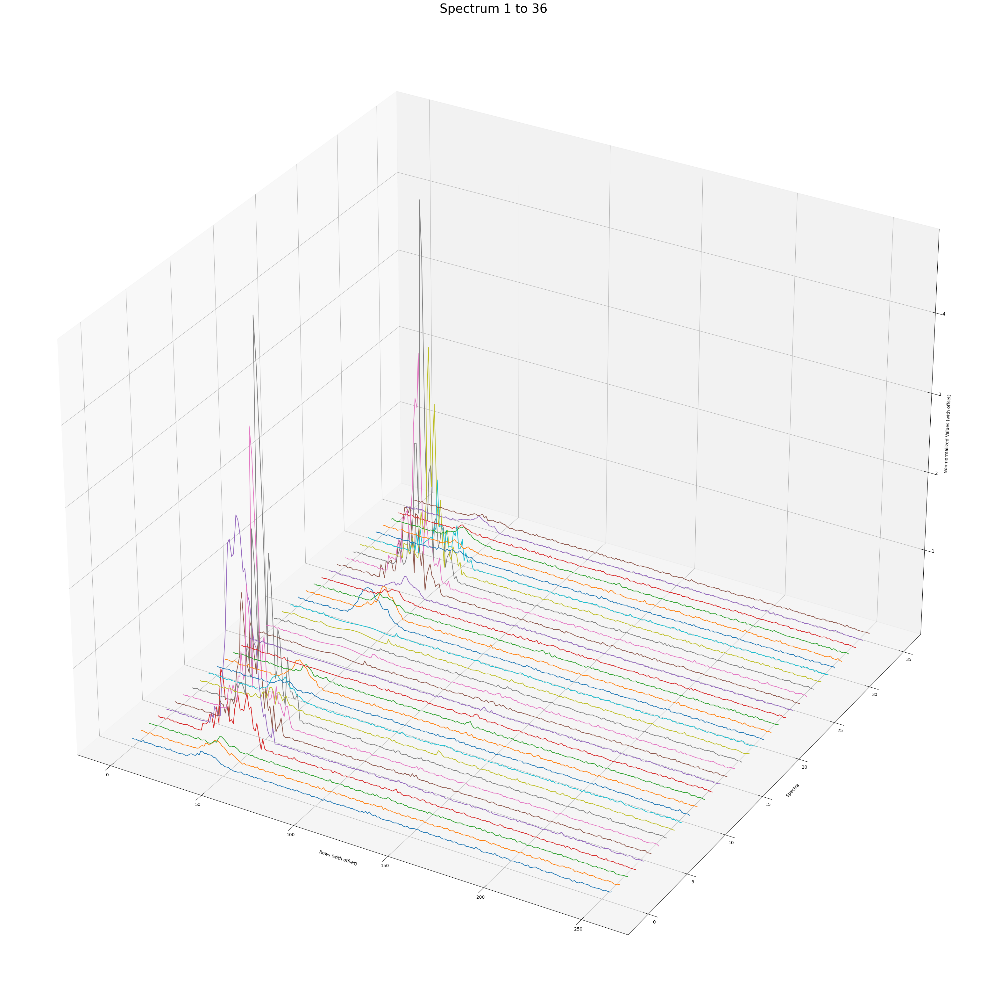

In [ ]:
plot_columns_with_offsets_no_norm(plot_data,1,36,0,0)

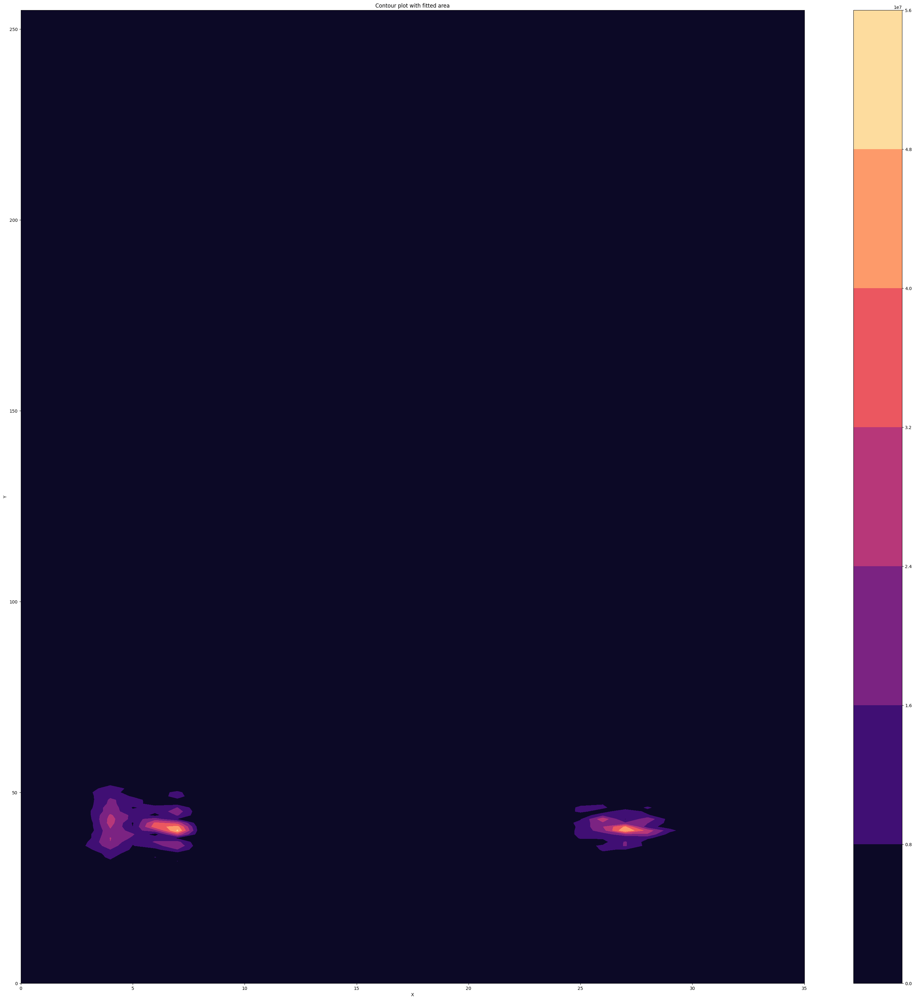

In [ ]:
# Now plot the data with the fitted area
plt.figure(figsize=(40, 40))
plt.contourf(X, Y, plot_data,  cmap='magma')  # Increase levels for higher resolution
plt.colorbar()  # optional, to show color scale
plt.title('Contour plot with fitted area')
plt.xlabel('X')
plt.ylabel('Y')
plt.show()


## Method 3, replcaing
Reaplcing the lipid signal with the backgound signal

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

x_start, x_end = 13, 20
y_start, y_end = 25, 60  # Adjust this to 60

scaling_factor = 1e-2 # The scaling factor to apply to the sliced area

# Apply the scaling factor to the sliced area
plot_data[y_start:y_end, x_start:x_end] = plot_data[100:135, x_start:x_end]

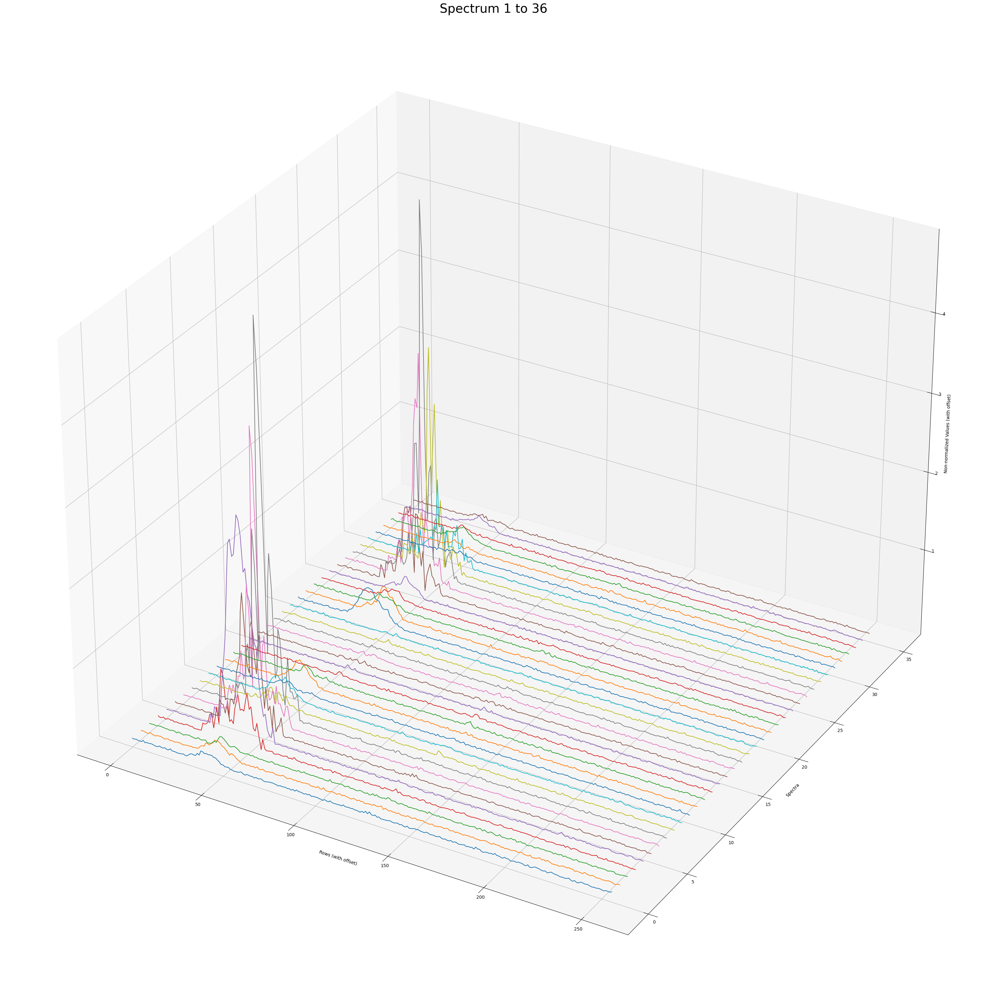

In [ ]:
plot_columns_with_offsets_no_norm(plot_data,1,36,0,0)

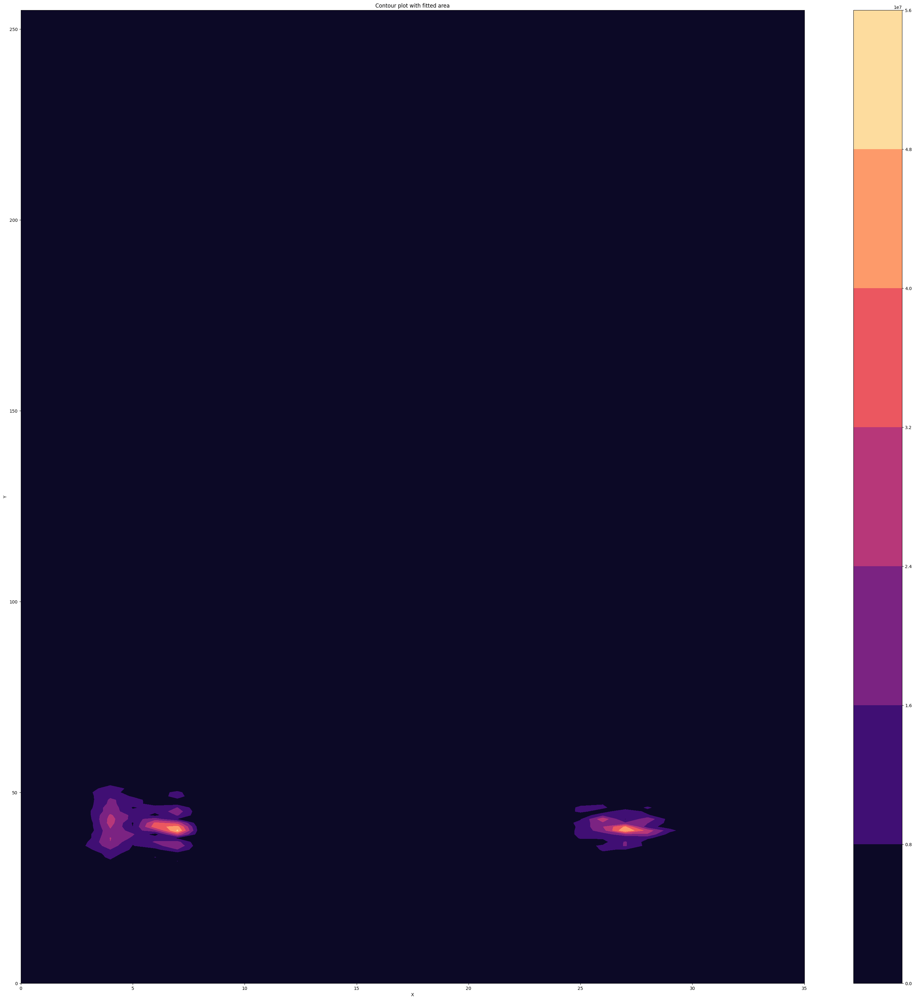

In [ ]:
# Now plot the data with the fitted area
plt.figure(figsize=(40, 40))
plt.contourf(X, Y, plot_data,  cmap='magma')  # Increase levels for higher resolution
plt.colorbar()  # optional, to show color scale
plt.title('Contour plot with fitted area')
plt.xlabel('X')
plt.ylabel('Y')
plt.show()

In [ ]:

# install tools for pdf output

!sudo apt-get install texlive-xetex texlive-fonts-recommended texlive-plain-generic

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
texlive-fonts-recommended is already the newest version (2021.20220204-1).
texlive-plain-generic is already the newest version (2021.20220204-1).
texlive-xetex is already the newest version (2021.20220204-1).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.


In [ ]:

# output as PDF
!jupyter nbconvert --to pdf '/content/MR_2D_lipid_signal_removing.ipynb' --output-dir /content/

[NbConvertApp] Converting notebook /content/MR_2D_lipid_signal_removing.ipynb to pdf
/usr/local/lib/python3.10/dist-packages/nbconvert/filters/datatypefilter.py:41: UserWarning: Your element with mimetype(s) dict_keys(['text/html']) is not able to be represented.
  warn(
[NbConvertApp] Support files will be in MR_2D_lipid_signal_removing_files/
[NbConvertApp] Making directory ./MR_2D_lipid_signal_removing_files
[NbConvertApp] Making directory ./MR_2D_lipid_signal_removing_files
[NbConvertApp] Making directory ./MR_2D_lipid_signal_removing_files
[NbConvertApp] Making directory ./MR_2D_lipid_signal_removing_files
[NbConvertApp] Making directory ./MR_2D_lipid_signal_removing_files
[NbConvertApp] Making directory ./MR_2D_lipid_signal_removing_files
[NbConvertApp] Making directory ./MR_2D_lipid_signal_removing_files
[NbConvertApp] Making directory ./MR_2D_lipid_signal_removing_files
[NbConvertApp] Making directory ./MR_2D_lipid_signal_removing_files
[NbConvertApp] Writing 92881 bytes to not